# SC-RNA-Seq of Peng et al dataset: Preprocessing, normalization, integration and cell type annotation

In [1]:
# Load the required modules

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scvi
from scipy.sparse import csr_matrix
from sklearn.decomposition import PCA
import warnings
from scipy.stats import median_abs_deviation
import os
import pickle as pkl
from kneed import KneeLocator as kl

# Ignore the warning messages
warnings.filterwarnings("ignore")

/home/victor/miniconda3/envs/sc_rnaseq/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/victor/miniconda3/envs/sc_rnaseq/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/victor/miniconda3/envs/sc_rnaseq/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The count matrix data used can be found in: https://download.cncb.ac.cn/gsa/CRA001160/ 

In [2]:
# Load the count matrix as an anndata object
adata = sc.read_text('./Data/count-matrix.txt').T
adata.obs['cell_name'] = adata.obs.index
adata

AnnData object with n_obs × n_vars = 57530 × 24005
    obs: 'cell_name'

In [3]:
# Create a columns with sample info 
adata.obs['Sample'] = adata.obs.index
adata.obs['Sample'] = adata.obs['Sample'].map(lambda x: x[:-17]) 

## Now lets calculate quality parameters

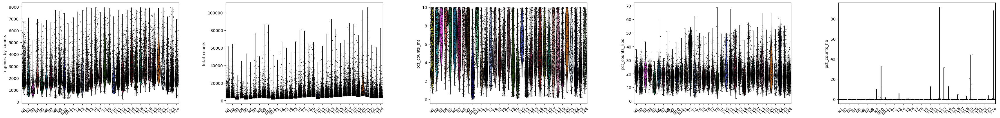

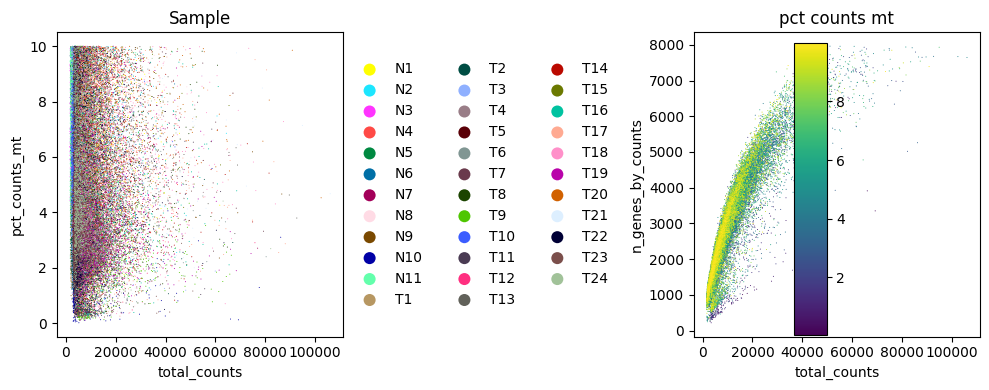

In [4]:

# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=[20], inplace=True)

sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
            jitter=0.4, groupby = 'Sample', rotation= 45)

# Show the QC parameter plots
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="Sample",ax=axes[0],show=False)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt", ax=axes[1], show=False)

plt.tight_layout()

plt.show()


## Now we will filter the outliers based in this qc parameters

Definiremos una función que pueda detectar si una célula es un outlier para una determinada métrica de las calculadas usando el criterio de MAD (se filtraran aquellas células que se desvíen n median absolute desviations de el valor de la mediana)

In [5]:
# This function detects outliers using the MAD (Median Absolute Desviations) criteria
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [6]:
# Detect the outliers
adata.obs["outlier"] = (is_outlier(adata, "log1p_total_counts", 5) | is_outlier(adata, "log1p_n_genes_by_counts", 5) | is_outlier(adata, "pct_counts_in_top_20_genes", 5))

adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (adata.obs["pct_counts_mt"] > 10)


# Filter out the outliers
print(f"Initial number of cells: {adata.n_obs}")
print(sum(adata.obs["outlier"] | adata.obs["mt_outlier"]), f"cells are considered outliers and are going to be filtered out")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()
print(f"Post-filtering number of cells: {adata.n_obs}\n")

# Filter out genes expressed in less than 3 cells and wiht a low number (<200) of total counts in the dataset

sc.pp.filter_genes(adata,min_cells = 3)
sc.pp.filter_genes(adata,min_counts=200)

# Remove the columns created for outlier filtering
adata.obs.drop(["outlier","mt_outlier"],axis=1,inplace=True)



Initial number of cells: 57530
3264 cells are considered outliers and are going to be filtered out
Post-filtering number of cells: 54266



## Ahora pasamos a la predicción y filtrado de los doublets

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 216/400:  54%|█████▍    | 216/400 [10:16<08:45,  2.86s/it, v_num=1, train_loss_step=0.263, train_loss_epoch=0.217] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.191. Signaling Trainer to stop.


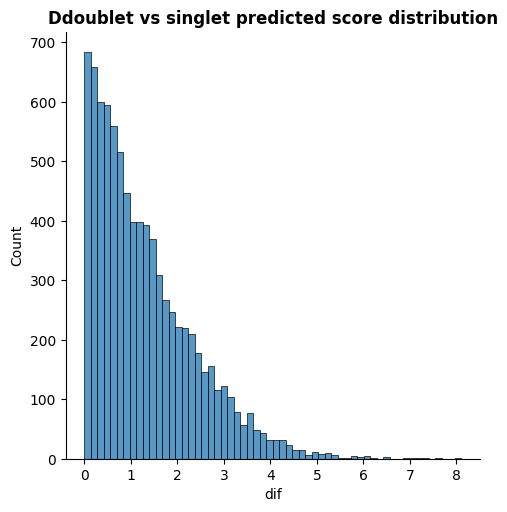

In [7]:
# Create or charge the doublets prediction model
doublets = {}

model_path = "./Models/Doublets_model.pkl"

# Check if there is a saved model and load it
if os.path.exists(model_path):
    with open(model_path,"rb") as f:
        vae = pkl.load(f)
# Create and save the model if it doesnt exists
else:
    scvi.model.SCVI.setup_anndata(adata)
    vae = scvi.model.SCVI(adata) # This model captures the variance of the data
    vae.train()
    with open(model_path,"wb") as f:
        pkl.dump(vae,f)    

# Train the model for doublets prediction
solo = scvi.external.SOLO.from_scvi_model(vae)
solo.train()  

# Do a soft threshold prediction
df = solo.predict()
# Append a hard threshold prediction column
df['prediction'] = solo.predict(soft = False)

# Create a column with the difference of the scores between doublet and singlet
df['dif'] = df.doublet - df.singlet

# Show the distribution of this parameter for barcodes predicted to be doublets
sns.displot(df[df.prediction == 'doublet'], x = 'dif')
plt.title(f"Ddoublet vs singlet predicted score distribution", fontweight=800)

# Save a list with the barcodes predicted to be doublets (with a great score difference)
doub_l = df[(df.prediction == 'doublet') & (df.dif > 1)].index.tolist()

In [8]:
# Filter out the doublets barcodes
adata.obs['doublet'] = adata.obs.index.isin(doub_l)
adata= adata[~adata.obs.doublet].copy()

## Post filtering qc

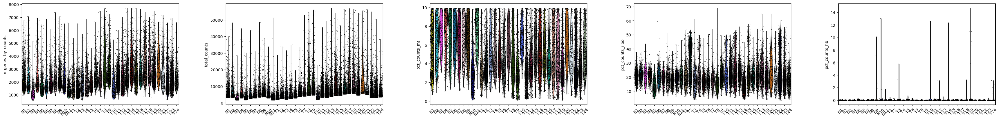

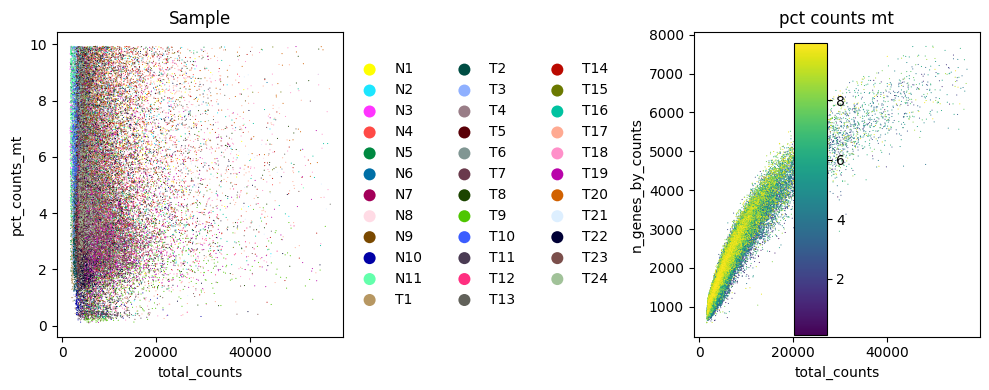

In [9]:

# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))


sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
            jitter=0.4, groupby = 'Sample', rotation= 45)

# Crete a figure to show the QC parameters
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="Sample",ax=axes[0],show=False)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt", ax=axes[1], show=False)

plt.tight_layout()

plt.show()

## Normalization

In [10]:
adata.layers['counts'] = csr_matrix(adata.X) # Save the non normalized data in a compressed matrix

adata.raw = adata # Save the non normalized data counts in the raw atribute

# Normalize to a 10000 depth and log transform the data
sc.pp.normalize_total(adata, target_sum=1e4) 
sc.pp.log1p(adata)

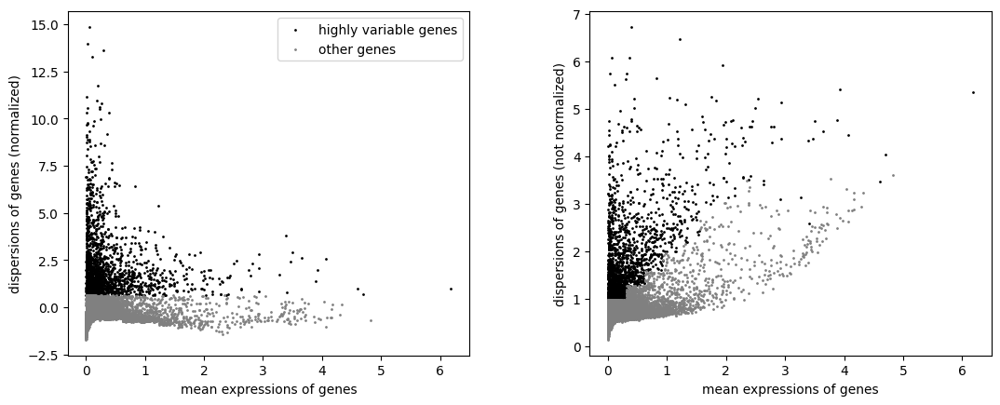

In [11]:
# Select and compute highly variable genes 
sc.pp.highly_variable_genes(adata,n_top_genes=2000)

# Plot variable genes
sc.pl.highly_variable_genes(adata)

# Actually do the filtering and subset for variable genes in the dataset
adata = adata[:, adata.var.highly_variable].copy()

adata.layers['hv_counts'] = adata.X.copy() # Save the normalized highly variable counts in a new layer

In [12]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. 
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'],n_jobs=30)

# Scale the data to unit variance.
sc.pp.scale(adata, max_value=10)

# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.
sc.tl.pca(adata, svd_solver='arpack')

In [13]:
# Define new function that finds the elbow dimension 
def PCA_Elbow_fit(data):
    model = PCA().fit(data)
    explained_variance = model.explained_variance_ratio_
    pcs = list(range(1, explained_variance.shape[0]+1))#enumerate(explained_variance,1)
    klm = kl(pcs, explained_variance, S=1.0, curve='convex', direction='decreasing')
    pcs_used = klm.knee
    pc_list = list(range(1, pcs_used+1))
    new_data = PCA(n_components= pcs_used, svd_solver='arpack').fit_transform(data)

    if pcs_used >50:
        pcs_used=50
        
    return pcs_used, new_data, pcs, explained_variance, pc_list

50


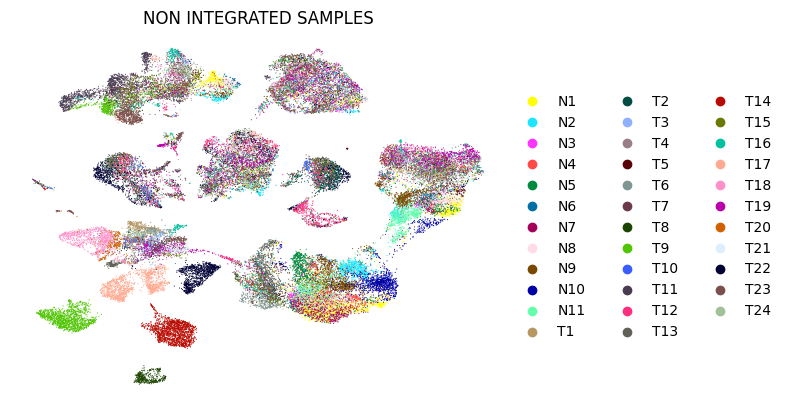

In [14]:
# Extract cell x gene data from scanpy annData and create new pandas dataframe

new_frame = pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names)

pandas_data = new_frame.values

# Execute PCA elbow_fitting_funcion
dim,new_matrix,pc_ax,pc_ay,col_labels=PCA_Elbow_fit(pandas_data)
print(dim)
# Neigbours computation and umap
sc.pp.neighbors(adata, n_pcs = dim) # compute nearest neighbors
sc.tl.umap(adata)

# Plot UMAP
sc.pl.umap(adata, color = ['Sample'], frameon = False,title="NON INTEGRATED SAMPLES")

## Integration



In [15]:
# Generate the model and integrate data

model_path = f"./Models/Integration_model.pkl"

# Check if there is a saved model and load it
if os.path.exists(model_path):
    with open(model_path,"rb") as f:
        model = pkl.load(f)

# Create and save the model if it doesnt exists
else:
    scvi.model.SCVI.setup_anndata(adata, layer = "hv_counts",
                                categorical_covariate_keys= ["Sample"],
                                continuous_covariate_keys= ['total_counts', 'pct_counts_mt'])

    model = scvi.model.SCVI(adata)
    model.train()

    with open(model_path,"wb") as f:
        pkl.dump(model,f)  

# Save the data for representation
adata.obsm['X_scVI'] = model.get_latent_representation()

# Save the normalized integrated data
adata.layers['scvi_normalized'] = model.get_normalized_expression()

# Compute neighbors using scVI model
sc.pp.neighbors(adata, use_rep = 'X_scVI', metric="correlation")


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 160/160: 100%|██████████| 160/160 [14:06<00:00,  4.98s/it, v_num=1, train_loss_step=545, train_loss_epoch=537]

`Trainer.fit` stopped: `max_epochs=160` reached.


Epoch 160/160: 100%|██████████| 160/160 [14:06<00:00,  5.29s/it, v_num=1, train_loss_step=545, train_loss_epoch=537]


Plotting integrated data UMAP:


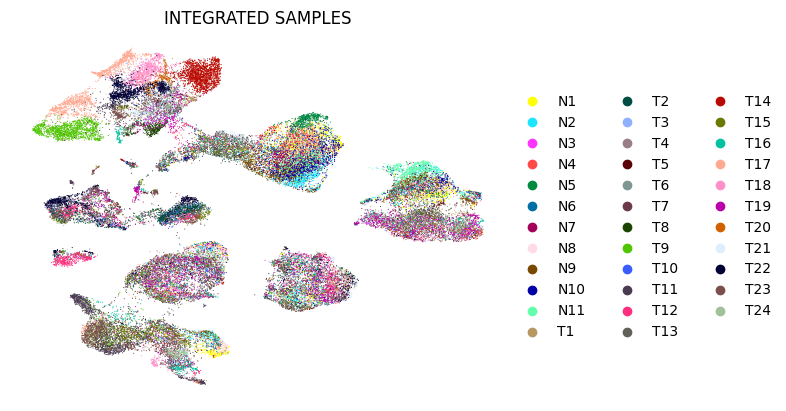

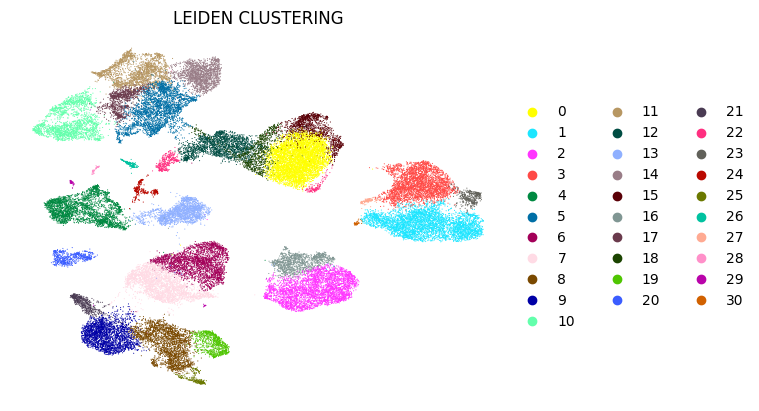

In [60]:
# Generate UMAP and leiden clustering
sc.tl.umap(adata, min_dist=0.4)
sc.tl.leiden(adata, resolution = 0.9) #key_added="leiden_scvi"

print(f"Plotting integrated data UMAP:")

sc.pl.umap(adata, color = ['Sample'], frameon = False,title="INTEGRATED SAMPLES")
sc.pl.umap(adata, color = ['leiden'], frameon = False,title="LEIDEN CLUSTERING")

# Annotation

Click here to download reference data: https://figshare.com/ndownloader/files/34702003 

In [17]:
# Charge a reference pancreas dataset
ref_data_panc = sc.read_h5ad("./Data/reference_Pancreas.h5ad")
ref_data_panc

AnnData object with n_obs × n_vars = 13497 × 58870
    obs: 'organ_tissue', 'method', 'donor', 'anatomical_information', 'n_counts_UMIs', 'n_genes', 'cell_ontology_class', 'free_annotation', 'manually_annotated', 'compartment', 'gender'
    var: 'gene_symbol', 'feature_type', 'ensemblid', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: '_scvi', '_training_mode', 'cell_ontology_class_colors', 'dendrogram_cell_type_tissue', 'dendrogram_computational_compartment_assignment', 'dendrogram_consensus_prediction', 'dendrogram_tissue_cell_type', 'donor_colors', 'donor_method_colors', 'hvg', 'method_colors', 'neighbors', 'organ_tissue_colors', 'sex_colors', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_scvi', 'X_scvi_umap', 'X_umap'
    layers: 'decontXcounts', 'raw_counts'
    obsp: 'connectivities', 'distances'

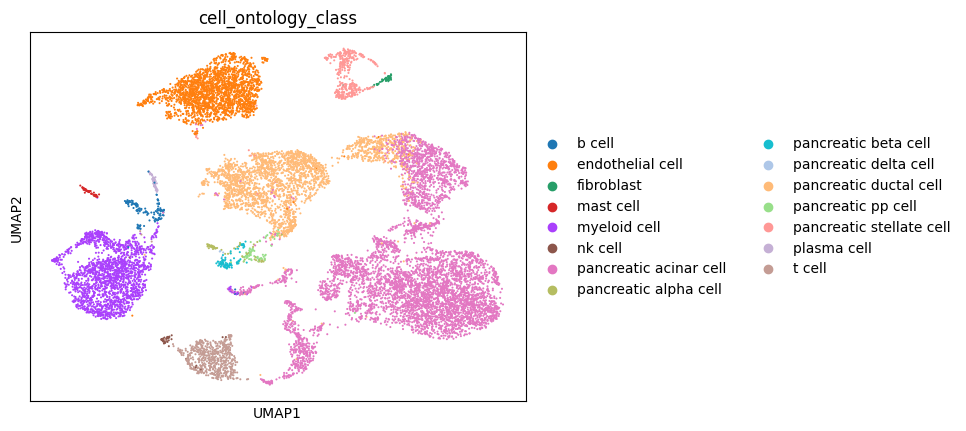

In [18]:
# This is my reference data
sc.pl.umap(ref_data_panc, color=["cell_ontology_class"])

In [19]:
# Load the count matrix as an anndata object
original_data = sc.read_text('./Data/count-matrix.txt').T

# Create a columns with sample info 
original_data.obs['Sample'] = original_data.obs.index
original_data.obs['Sample'] = original_data.obs['Sample'].map(lambda x: x[:-17]) 

In [20]:
adata_annotation = original_data.concatenate(ref_data_panc)
adata_annotation

AnnData object with n_obs × n_vars = 71027 × 17762
    obs: 'Sample', 'organ_tissue', 'method', 'donor', 'anatomical_information', 'n_counts_UMIs', 'n_genes', 'cell_ontology_class', 'free_annotation', 'manually_annotated', 'compartment', 'gender', 'batch'
    var: 'gene_symbol-1', 'feature_type-1', 'ensemblid-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'mean-1', 'std-1'

In [21]:
adata_annotation.layers["counts"] = adata_annotation.X.copy()

sc.pp.normalize_total(adata_annotation, target_sum=1e4)
sc.pp.log1p(adata_annotation)
adata_annotation.raw = adata_annotation

sc.pp.highly_variable_genes(adata_annotation, flavor = 'seurat_v3', n_top_genes=2000,
                            layer = "counts", batch_key="batch", subset = True)

In [22]:
vae_path= "./Models/scvi_labeltransfer_vae_model_Pancreas_data.pkl"


if not os.path.exists(vae_path):

    scvi.model.SCVI.setup_anndata(adata_annotation, layer = 'counts', batch_key='batch')
    vae = scvi.model.SCVI(adata_annotation)
    vae.train()

    with open(vae_path,"wb") as f:
        pkl.dump(vae,f)

else:
    with open(vae_path,"rb") as f:
        vae = pkl.load(f)
    

In [23]:
adata_annotation.obs['cell_ontology_class'] = adata_annotation.obs['cell_ontology_class'].cat.add_categories('Unknown')
adata_annotation.obs = adata_annotation.obs.fillna(value = {'cell_ontology_class': 'Unknown'})
adata_annotation.obs

,Sample,organ_tissue,method,donor,anatomical_information,n_counts_UMIs,n_genes,cell_ontology_class,free_annotation,manually_annotated,compartment,gender,batch
T1_AAACCTGAGATGTCGG-0,T1,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,<NA>,NaN,NaN,0
T1_AAACGGGGTCATGCAT-0,T1,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,<NA>,NaN,NaN,0
T1_AAAGATGCATGTTGAC-0,T1,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,<NA>,NaN,NaN,0
T1_AAAGATGGTCGAGTTT-0,T1,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,<NA>,NaN,NaN,0
T1_AAAGATGGTCTCTCTG-0,T1,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,<NA>,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
B107920_P22_S283.homo.gencode.v30.ERCC.chrM-1,NaN,Pancreas,smartseq2,TSP1,Endocrine,342511.0,1349.0,pancreatic ductal cell,pancreatic ductal cell,True,epithelial,female,1
B107920_P3_S264.homo.gencode.v30.ERCC.chrM-1,NaN,Pancreas,smartseq2,TSP1,Endocrine,139924.0,888.0,pancreatic acinar cell,pancreatic acinar cell,True,epithelial,female,1
B107920_P4_S265.homo.gencode.v30.ERCC.chrM-1,NaN,Pancreas,smartseq2,TSP1,Endocrine,732809.0,1670.0,pancreatic acinar cell,pancreatic acinar cell,True,epithelial,female,1
B107920_P7_S268.homo.gencode.v30.ERCC.chrM-1,NaN,Pancreas,smartseq2,TSP1,Endocrine,1058668.0,1396.0,pancreatic ductal cell,pancreatic ductal cell,True,epithelial,female,1


In [24]:
lvae_path = "./Models/scvi_labeltransfer_lvae_model_Pancreas_data.pkl"

if not os.path.exists(lvae_path):
    # Set up the data for the model
    lvae = scvi.model.SCANVI.from_scvi_model(vae, adata = adata_annotation, unlabeled_category = 'Unknown',
                                            labels_key = 'cell_ontology_class')

    # Train the model
    lvae.train(max_epochs=20, n_samples_per_label=100)

    # Save the trained model
    with open(lvae_path,"wb") as f:
        pkl.dump(lvae,f)

else:
    # Read the trained model
    with open(lvae_path,"rb") as f:
        lvae = pkl.load(f)

In [25]:
# Actually perform the prediction

adata_annotation.obs['predicted'] = lvae.predict(adata_annotation)
adata_annotation.obs.predicted

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


T1_AAACCTGAGATGTCGG-0                                          fibroblast
T1_AAACGGGGTCATGCAT-0                            pancreatic stellate cell
T1_AAAGATGCATGTTGAC-0                                        myeloid cell
T1_AAAGATGGTCGAGTTT-0                                        myeloid cell
T1_AAAGATGGTCTCTCTG-0                                    endothelial cell
                                                           ...           
B107920_P22_S283.homo.gencode.v30.ERCC.chrM-1      pancreatic ductal cell
B107920_P3_S264.homo.gencode.v30.ERCC.chrM-1       pancreatic acinar cell
B107920_P4_S265.homo.gencode.v30.ERCC.chrM-1       pancreatic acinar cell
B107920_P7_S268.homo.gencode.v30.ERCC.chrM-1       pancreatic ductal cell
B107920_P9_S270.homo.gencode.v30.ERCC.chrM-1       pancreatic acinar cell
Name: predicted, Length: 71027, dtype: object

In [26]:
# Extract the prediction confidence in a dictionary
probabilities = lvae.predict(adata_annotation,soft=True)


probabilities.index = probabilities.index.str[:-2]
confidence = {i[0]:max(i[1]) for i in probabilities.iterrows()}

In [27]:
adata_annotation.obs['bc2'] = adata_annotation.obs.index.map(lambda x: x[:-2]) # Extract the barcodes (removing the last two characters, that corresponds to the batch)
cell_mapper = dict(zip(adata_annotation.obs.bc2, adata_annotation.obs.predicted)) # Create a dictionary to map the barcodes to the predicted cell types

In [61]:
adata.obs["cell_type_prediction"] = adata.obs.index.map(cell_mapper)
adata.obs["cell_type_prediction_probability"] = adata.obs.index.map(confidence)

In [62]:
original_data = original_data[adata.obs.index,:]

# Save the normalized log transformed data in the raw layer to do the plots in further steps
sc.pp.normalize_total(original_data,target_sum=10e4)
sc.pp.log1p(original_data)
adata.raw = original_data

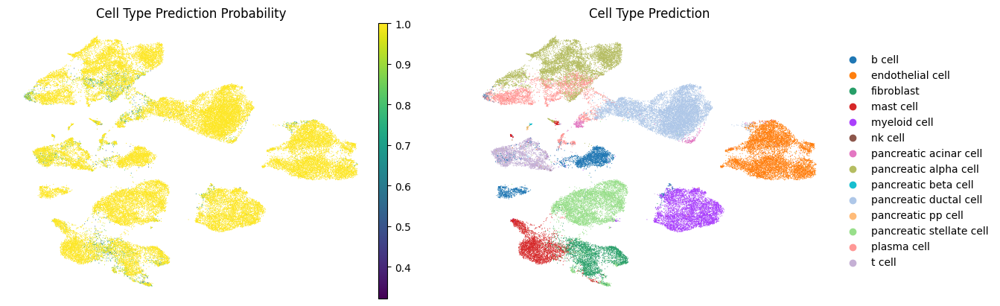

In [63]:
sc.pl.umap(adata,color=["cell_type_prediction_probability","cell_type_prediction"],frameon=False,title=["Cell Type Prediction Probability","Cell Type Prediction"])

In [64]:
def asign_celltype_to_cluster(adata_with_predictions,prediction_label_key="cell_type_prediction", cluster_key="leiden",
                              celltype_label_out_name = "per_cluster_celltype",proportion_label_out_name= "per_cluster_proportion",
                              calculate_proportion=True):

    # Extract a dataframe with the celltype per clusters value counts
    df = adata_with_predictions.obs[[cluster_key,prediction_label_key]].value_counts().to_frame().reset_index().rename(columns={0:"n_cells"})

    clusters , cell_type , cell_type_proportions = [], [], []

    # Parse these dataframe and find the principal cell type for each cluster and its proportion in the cluster 
    for cluster in df["leiden"].unique():

        df_cls = df[df["leiden"] == cluster].reset_index(drop=True)


        principal_cell_type =df_cls.cell_type_prediction[0]
        principal_cell_type_n = df_cls.n_cells[0]
        
        if len(df_cls)>1:
            other_cell_type_n = df_cls.n_cells[1:].sum()
            cell_type_proportion = principal_cell_type_n/(other_cell_type_n+principal_cell_type_n)
        else:
            cell_type_proportion = 1
        
        clusters.append(cluster)
        cell_type.append(principal_cell_type)
        cell_type_proportions.append(cell_type_proportion)

    df_principal_celltypes = pd.DataFrame({"Cluster":clusters,"Cell_type":cell_type,"cell_type_proportions":cell_type_proportions})
    
    # ASSIGN THE CELLTYPE LABEL 
    cell_type_cluster_dicts = { i[1][0]:i[1][1] for i in df_principal_celltypes.iterrows()}
    adata_with_predictions.obs[celltype_label_out_name]= adata_with_predictions.obs[cluster_key].map(cell_type_cluster_dicts)

    # ASSIGN THE PROPORTION LABEL 
    if calculate_proportion:
        cell_type_proportion_cluster_dicts = { i[1][0]:i[1][2] for i in df_principal_celltypes.iterrows()}    
        adata_with_predictions.obs[proportion_label_out_name]= adata_with_predictions.obs[cluster_key].map(cell_type_proportion_cluster_dicts).astype(float)

    return adata_with_predictions

In [65]:
# Calculate the per cluster cell type prediction

asign_celltype_to_cluster(adata)

AnnData object with n_obs × n_vars = 49966 × 2000
    obs: 'cell_name', 'Sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_type_prediction', 'cell_type_prediction_probability', 'per_cluster_celltype', 'per_cluster_proportion', 'Condition'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', '_scvi_uuid', '_scvi_manager_uuid', 'leiden', 'leiden_colors', 'cell_type_prediction_colors', 'per_cluster_celltype_colo

In [66]:
adata.obs["Condition"]= adata.obs.Sample.str.replace("\d","",regex=True)

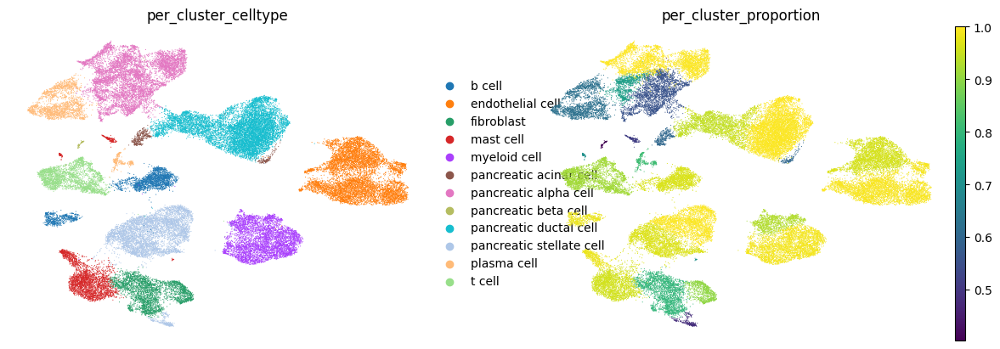

In [67]:
sc.pl.umap(adata,color=["per_cluster_celltype","per_cluster_proportion"],frameon=False)

In [68]:
# Define a function that gives a new label to the cells of a cluster (for manual annotation)

def relabel_cluster_celltypes(adata,new_label,target_clusters,cluster_key="leiden",cell_type_key="per_cluster_celltype",inplace=True,new_column_key= None):

    values_to_change = adata.obs[cluster_key].isin(target_clusters)

    celltypeslist = adata.obs[cell_type_key].to_numpy()

    celltypeslist[values_to_change] = new_label

    if inplace:

        adata.obs[cell_type_key] = celltypeslist

    else:
        adata.obs[new_column_key] = celltypeslist


In [101]:
# Create a dictionary with cell type markers

curated_dict = {"Ductal cells": ['EPCAM',"SOX9","CDH1"],
                "Fibroblasts": ["DCN","FBLN1","LUM"],
                "T CD4": ["CD4","GATA3","FOXP3","IL7R"],
                "T CD8": ["GZMB","CD8A","PRF1"],
                "B cell" : ['VPREB3', 'CD19', 'MS4A1'],
                "Stellate cells": ["PDGFRB"],
                "Endothelial cells":["VWF","EGFL7","EMCN"],
                "Macrophages": ["CD68","CD14","CD163"],
                "Dendritic cells": ["CD1C"],
                "Acinar cells": ["KLK1","PRSS3","CELA2B"],
                "Malign Ductal cells":["MUC1","CEACAM6","CTSE"],
                "Alpha cells":["GCG","PAX6","CHGB"],
                "Plasma cells":["MZB1","TNFRSF17","FKBP11","SSR4"],
                "Mast cells":["KIT", "TPSAB1","CPA3"],
                "my-CAF":["FAP","PDPN","ACTA2"]
                }

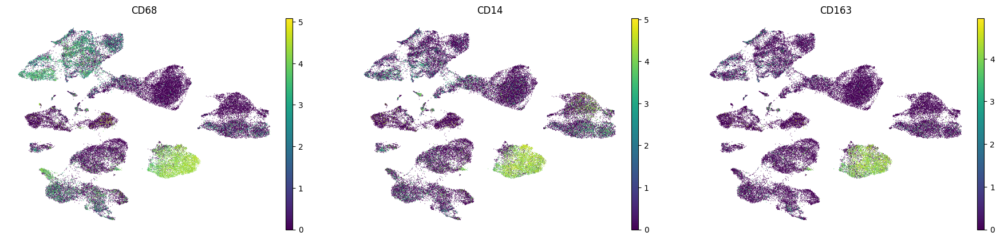

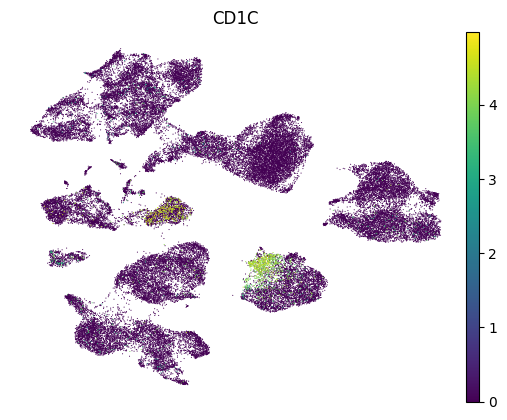

In [74]:
# Show macrophages and dendritic cells markers, it is clear that myeloid cells are composed of these two cell types 
sc.pl.umap(adata,color=curated_dict["Macrophages"],frameon=False,use_raw=True)
sc.pl.umap(adata,color=curated_dict["Dendritic cells"],frameon=False,use_raw=True)
relabel_cluster_celltypes(adata,new_label="Macrophage",target_clusters=["2"])
relabel_cluster_celltypes(adata,new_label="Dendritic cell",target_clusters=["16"])  

Identify plasma cells

We can see that not all the cells initialy labelled as plasma cells express plasma cells labels

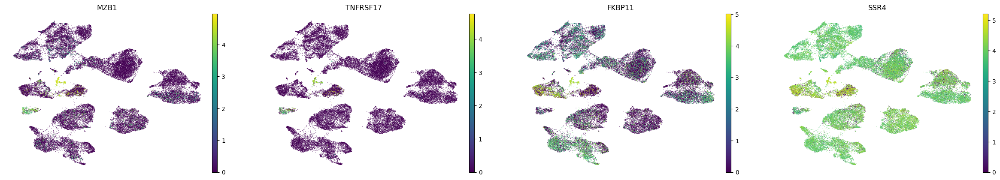

In [77]:
sc.pl.umap(adata,color=curated_dict["Plasma cells"],frameon=False,use_raw=True)

relabel_cluster_celltypes(adata,new_label="Plasma cell",target_clusters=["24"])

Identify alpha cells

We can see that not all the cells initialy labelled as alpha cells express alpha cells labels, we are going to include all the endocrine cell types in the label Endocrine cell

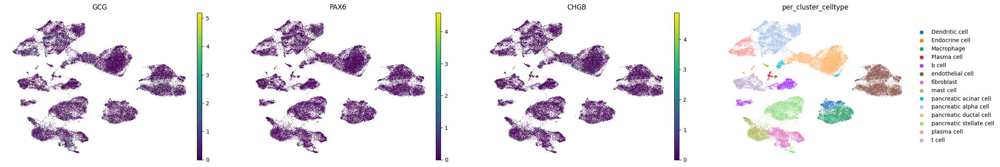

In [81]:
sc.pl.umap(adata,color=curated_dict["Alpha cells"]+["per_cluster_celltype"],frameon=False,use_raw=True)
relabel_cluster_celltypes(adata,new_label="Endocrine cell",target_clusters=["28"])

Identify Mast cells

We can see that not all the cells initialy labelled as mast cells express mast cells labels

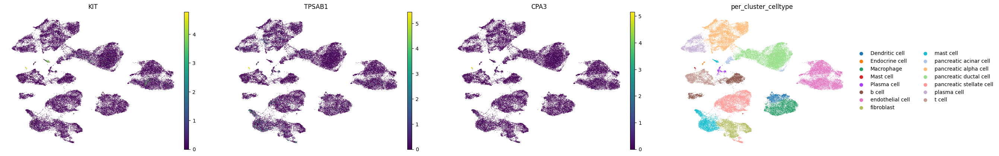

In [85]:
sc.pl.umap(adata,color=curated_dict["Mast cells"]+["per_cluster_celltype"],frameon=False,use_raw=True)

relabel_cluster_celltypes(adata,new_label="Mast cell",target_clusters=["29"])


Identify fibroblasts and my-CAFs

If we look at my-CAFs and fibroblast specific markers, we can se that there is a little overlap in their expression, but the cluster marked like fibroblast and the little one by its side labelled like stellate cell have higher expression of specific Fibroblast markers. On the other hand, the cluster labelled like mast cells under the aforementioned shows higher expression of my-CAF markers and stellate cells labelled clusters express the expected markers.

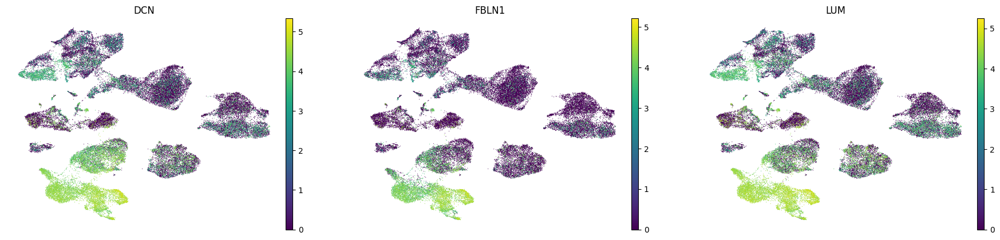

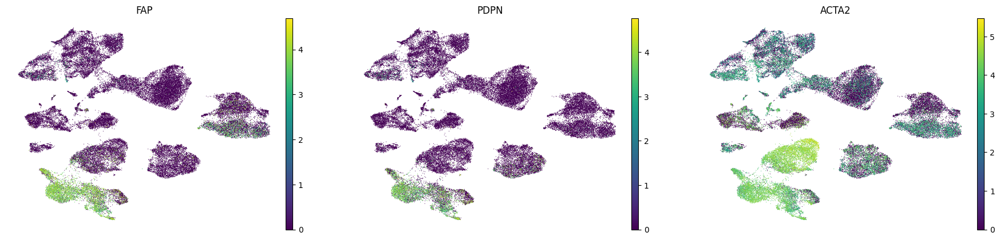

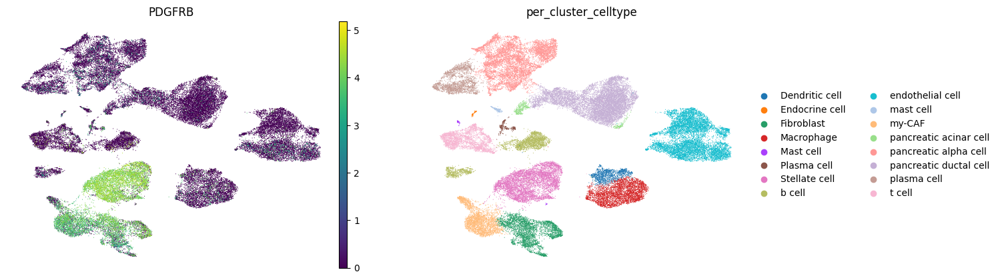

In [89]:
sc.pl.umap(adata,color=curated_dict["Fibroblasts"],frameon=False,use_raw=True)
sc.pl.umap(adata,color=curated_dict["my-CAF"],frameon=False,use_raw=True)
sc.pl.umap(adata,color=curated_dict["Stellate cells"]+["per_cluster_celltype"],frameon=False,use_raw=True)

relabel_cluster_celltypes(adata,new_label="Fibroblast",target_clusters=["8","25","19"])
relabel_cluster_celltypes(adata,new_label="my-CAF",target_clusters=["9","21"])
relabel_cluster_celltypes(adata,new_label="Stellate cell",target_clusters=["7","6"])

Endothelial cells show expression of the expected markers so we labelled them like that

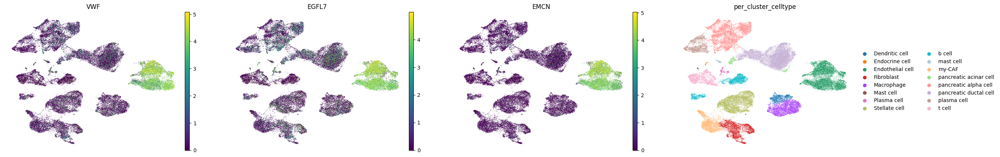

In [94]:

sc.pl.umap(adata,color=curated_dict["Endothelial cells"]+["per_cluster_celltype"],frameon=False,use_raw=True)
relabel_cluster_celltypes(adata,new_label="Endothelial cell",target_clusters=["30","1","3","23",'27'])

Identify B cells: the labell was correctly asigned

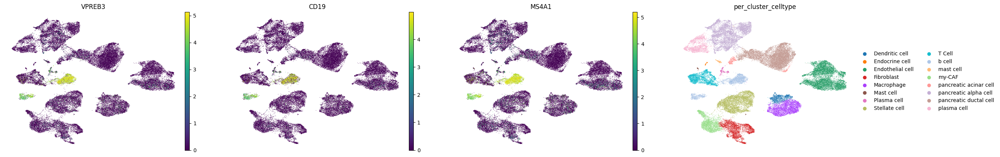

In [103]:
sc.pl.umap(adata,color=curated_dict["B cell"]+["per_cluster_celltype"],frameon=False,use_raw=True)
relabel_cluster_celltypes(adata,new_label="B cell",target_clusters=["13","20"])

We differenciated two T Cell subtypes based in known markers

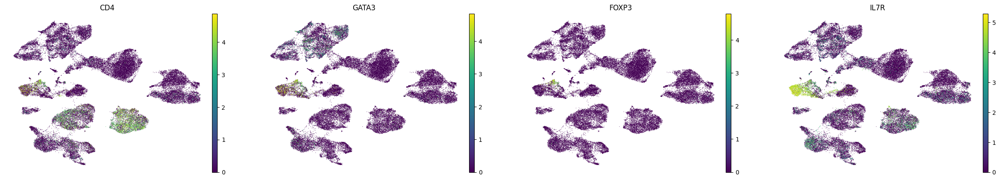

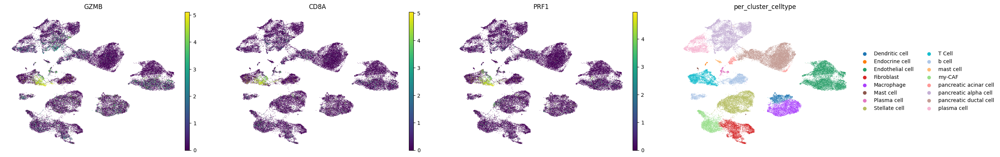

In [97]:
sc.pl.umap(adata,color=curated_dict["T CD4"],frameon=False,use_raw=True)
sc.pl.umap(adata,color=curated_dict["T CD8"]+["per_cluster_celltype"],frameon=False,use_raw=True)

relabel_cluster_celltypes(adata,new_label="T Cell",target_clusters=["4"])

Identify ductal cells

We labelled the cells that expressed ductal cell markers as ductal cells

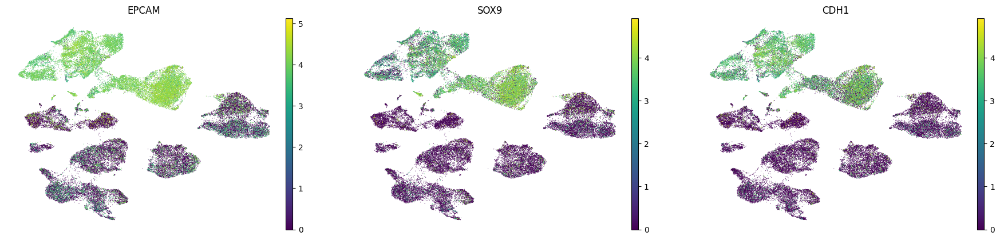

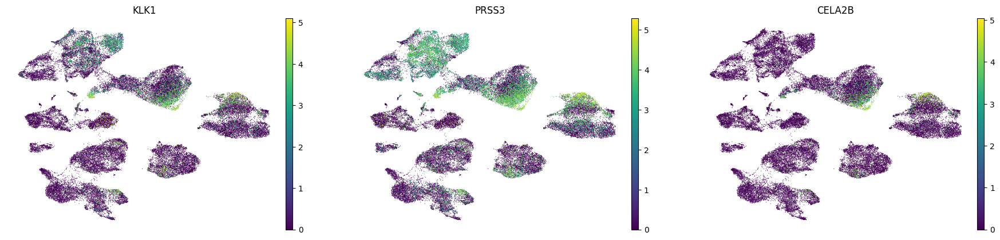

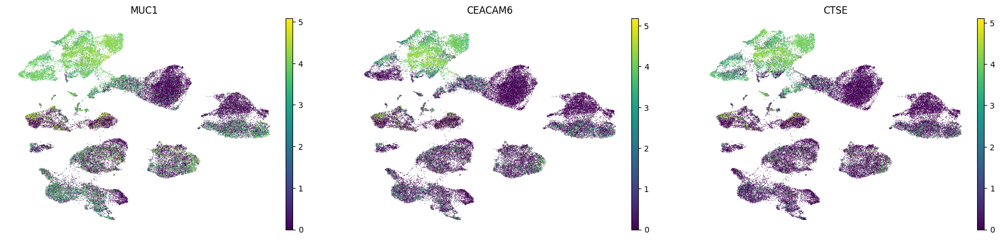

In [110]:
sc.pl.umap(adata,color=curated_dict["Ductal cells"],frameon=False,use_raw=True)
sc.pl.umap(adata,color=curated_dict["Acinar cells"],frameon=False,use_raw=True)
sc.pl.umap(adata,color=curated_dict["Malign Ductal cells"],frameon=False,use_raw=True)
relabel_cluster_celltypes(adata,new_label="Ductal cell",target_clusters=["0","12","15","18"])
relabel_cluster_celltypes(adata,new_label="Malign Ductal cell",target_clusters=["10","5","17","14","11","26"])
relabel_cluster_celltypes(adata,new_label="Acinar cell",target_clusters=["22"])


## FIND TCD4 AND MACROPHAGES SUBTYPES

The T CD4 regulatory cells show low expression of IL7R and high expression of TNFRSF18 and FOXP3. We reclusterized the CD4 cells  and find a cluster that express the T CD4 reg pattern.


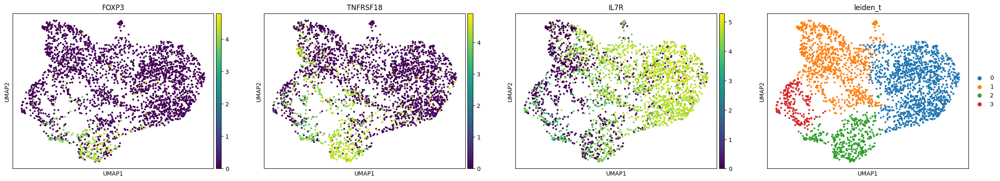

In [109]:
t_cells = adata[adata.obs.per_cluster_celltype=="T Cell",:]

sc.Neighbors(t_cells)
sc.tl.leiden(t_cells,resolution=0.2,key_added="leiden_t")
sc.tl.umap(t_cells,min_dist=0.3)

markers_T = ["FOXP3","TNFRSF18","IL7R","leiden_t"]
sc.pl.umap(t_cells,color=markers_T)

The GZMB CD8, PRF1 EXPRESSING CELLS ARE T CITOTOXIC CELLS 

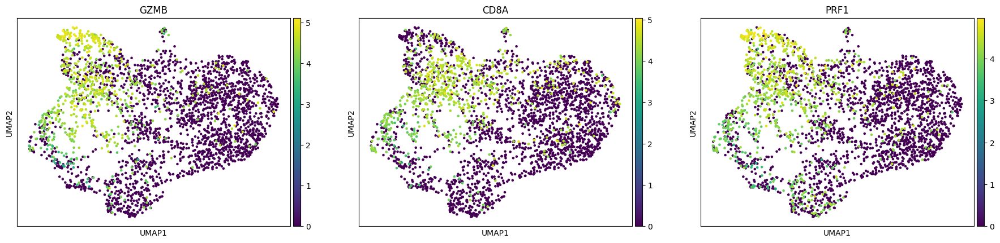

In [111]:
sc.pl.umap(t_cells,color=curated_dict["T CD8"])

In [112]:
# Assign the T reg label 
treg_cells = t_cells.obs.index[t_cells.obs.leiden_t=="2"]
new_per_cluster_celltype = ["T CD4 Reg" if barcode in treg_cells  else adata.obs.per_cluster_celltype[barcode] for barcode in adata.obs.index]
adata.obs.per_cluster_celltype = new_per_cluster_celltype

In [113]:
# Assign the T reg label 
tcd8_cells = t_cells.obs.index[t_cells.obs.leiden_t.isin(["1","3"])]
new_per_cluster_celltype = ["T CD8" if barcode in tcd8_cells  else adata.obs.per_cluster_celltype[barcode] for barcode in adata.obs.index]
adata.obs.per_cluster_celltype = new_per_cluster_celltype

In [114]:
# Assign the T reg label 
tcd4_cells = t_cells.obs.index[t_cells.obs.leiden_t=="0"]
new_per_cluster_celltype = ["T CD4" if barcode in tcd4_cells  else adata.obs.per_cluster_celltype[barcode] for barcode in adata.obs.index]
adata.obs.per_cluster_celltype = new_per_cluster_celltype

The macrophages could not be determined to have a phenotype more similar to M2 or M1, as they collectively presented a heterogeneous phenotype with characteristics of both types. The observed phenotypic heterogeneity in macrophages is consistent with their plasticity and functional diversity in response to specific signals from the microenvironment.

In [115]:
mac = adata[adata.obs.per_cluster_celltype=="Macrophage",:]

sc.Neighbors(mac)
sc.tl.leiden(mac,resolution=0.2,key_added="leiden_mac")
sc.tl.umap(mac,min_dist=0.3)

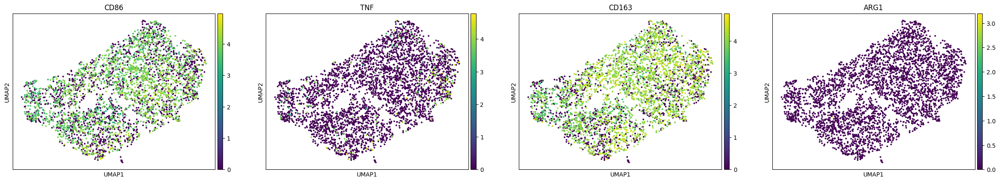

In [116]:
sc.pl.umap(mac,color=["CD86","TNF","CD163","ARG1"])

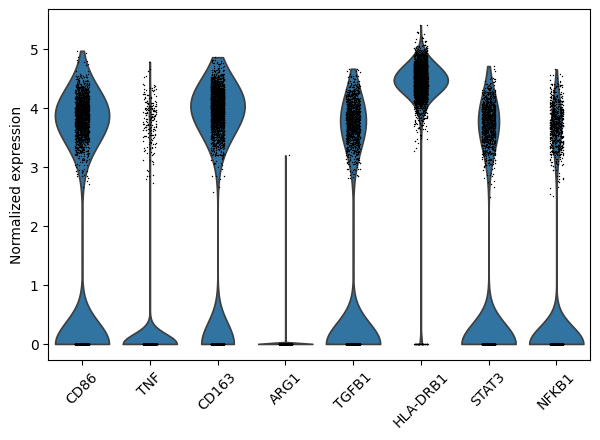

In [117]:
sc.pl.violin(mac,keys=["CD86","TNF","CD163","ARG1","TGFB1","HLA-DRB1","STAT3","NFKB1"],rotation=45,ylabel="Normalized expression")

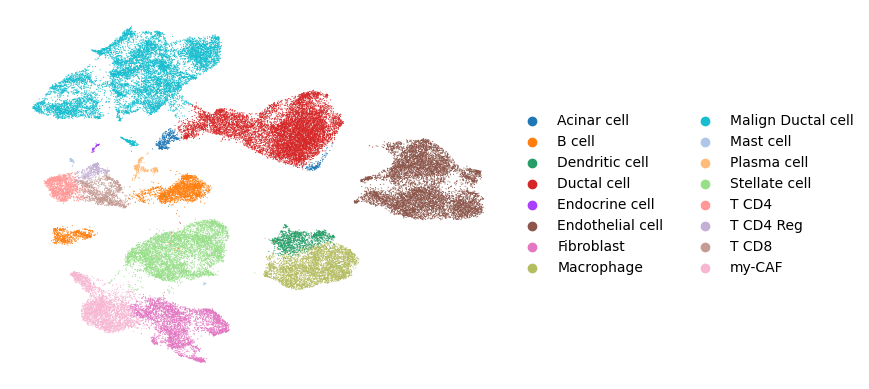

In [118]:
# Show the annotated dataset

sc.pl.umap(adata,color=["per_cluster_celltype"],frameon=False,use_raw=True,title="")

In [119]:
adata.write_h5ad("./Data/Peng_annotated.h5ad")